## TGNB Reddit Analysis  

### Scraping 
Here we will scrape the data from reddit and perform and EDA. We use the praw package to scrape and will filter for the word "surgery." We'll perform some EDA on the data before and after NLP processing. 


In [2]:
#Download English spacy, only run once
!python -m spacy download en_core_web_sm --quiet


[notice] A new release of pip is available: 23.2.1 -> 24.2
[notice] To update, run: pip install --upgrade pip
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [3]:
#Packages

#Scraping
import praw

#General
import pandas as pd
import numpy as np
import datetime as dt
import re
import math
import time
import string 
import collections as ct

#NLP
import spacy 
nlp = spacy.load("en_core_web_sm")
from nltk import tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize.casual import casual_tokenize

from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer

#Plots/visualizations
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import networkx as nx
import pycirclize as pc
from pycirclize import Circos
import plotly.express as px
from wordcloud import WordCloud
import plotly.graph_objects as go



In [44]:
#Functions

#Function for getting reddit posts for surgery filter
def get_posts(sub_name, n):
    subreddit = reddit.subreddit(sub_name)
    user_posts_list = []
    
    for submission in subreddit.search('surgery', limit=n):
        info_list = [submission.id, 
                     submission.title, 
                     submission.author,
                     submission.created_utc,
                     submission.score,
                     submission.subreddit,
                     submission.num_comments
                  ]
        user_posts_list.append(info_list)
        
    posts_df = pd.DataFrame(user_posts_list, columns=['id', 'title', 'author', 'created_UTC', 'score', 'subreddit', 'num_comments'])
    return posts_df 

#Function for getting authors of each post
def get_user_posts(author, n):
    redditor = reddit.redditor(author)
    user_posts_list = []
    
    for sub in redditor.submissions.top(limit = n):
        info_list = [sub.id, 
                     sub.title, 
                     sub.author,
                     sub.created_utc,
                     sub.score,
                     sub.subreddit,
                     sub.num_comments
                  ]
        user_posts_list.append(info_list)
    
    a = sorted(user_posts_list, key=lambda x: x[1], reverse = True)
    user_posts_df = pd.DataFrame(user_posts_list, columns=['id', 'title', 'author', 'created_UTC', 'score', 'subreddit', 'num_comments'])
    return user_posts_df 

#Function for getting authors of each post
def get_author(ids, comments_df):
    authors = []
    for id in ids:
        author = comments_df.loc[comments_df['ID'] == id, 'author'].values
        if len(author) > 0:
            authors.append(author[0])
    return authors

#NLP Functions

# Functions we will use in this notebook
# Turning a pandas column from one long string into a list 
def str_to_list(cell):
    cell = ''.join(c for c in cell if c not in "'[]")
    cell = cell.split(', ')
    return cell

# Need to remove \n characters
def remove_newline_char(text):
    for i in range(0,len(text)):
        text = text.replace("\n", "")
    return text 

# Remove special characters and additional punctuation 
def remove_special_chars(text):
    to_remove = list(string.punctuation)
    cleaned_text = text
    for i in to_remove:
        cleaned_text = cleaned_text.replace(i, '')
    return cleaned_text

# Remove numbers
def remove_num(text):
    cleaned_text = text
    for i in list(string.digits):
        cleaned_text = cleaned_text.replace(i, '')
    return cleaned_text
    
# Remove URL links
def remove_urls(text):
    url_pattern = re.compile(r'https?://\S+')
    return url_pattern.sub(r'', text)

# Tokenizing text
def tokenize_text(text):
    doc = nlp(text)
    tokens = [token.text for token in doc]
    return tokens

# Lemmatizing text 
def lemmatize_text(text):
    doc = nlp(text)
    lemmatized_tokens = [token.lemma_ for token in doc]
    return ' '.join(lemmatized_tokens)

# Lowercasing text
def lowercase_text(text):
    return text.lower()

# Count URL's
def count_urls(text):
    url_pattern = re.compile(r'https?://\S+')
    to_count = list(string.punctuation) + url_pattern
    count = sum(v for k, v in ct.Counter(text).items() if k in to_count)
    return count

# Count special characters
def count_special(text):
    special_char_extra = ['«', '»', '—', "…"]
    to_count = list(string.punctuation) + special_char_extra
    count = sum(v for k, v in ct.Counter(text).items() if k in to_count)
    return count

# Count stopwords 
def count_stopwords(text):
    # Preprocess text
    text = remove_newline_char(text)
    text = remove_urls(text)
    text = remove_special_chars(text)
    text = remove_num(text)
    # Only one space between words
    text = " ".join(text.split())
    # Preprocess with nlp 
    doc = nlp(text)
    # Get tokens, lemmatize, lowercase
    tokens = [token.lemma_.lower() for token in doc]
    # Check for empty tokens to prevent ZeroDivisionError
    if len(tokens) == 0:
        return 0  # or any default value you consider appropriate
    # Count the stopwords 
    stopword_list = list(nlp.Defaults.stop_words)
    stopwords_x = [w for w in tokens if w in stopword_list]
    count = len(stopwords_x) / len(tokens) * 100
    return count

def count_numbers(text):
    to_count = list(string.digits)
    count = sum(v for k, v in ct.Counter(text).items() if k in to_count)
    return count

# Remove stopwords
def remove_stopwords(text):
    doc = nlp(text)
    # Get tokens, lemmatize, lowercase, remove stop words
    tokens = [token.lemma_.lower() for token in doc if not token.is_stop]
    # Bring the tokens back together    
    text = " ".join(tokens)
    return text 

#All the text processing steps in one function
def preprocess_text(text):
    # Remove newline characters
    text = remove_newline_char(text)
    # Remove special characters  
    text = remove_special_chars(text)  
    # Only one space between words
    text = " ".join(text.split())   
    # Preprocess with nlp 
    doc = nlp(text)  
    # Get tokens, lemmatize, lowercase, remove stop words
    tokens = [token.lemma_.lower() for token in doc if not token.is_stop]  
    # Bring the tokens back together    
    text = " ".join(tokens)   
    # Remove newline characters again
    text = remove_newline_char(text)  
    # Return text (the text is not tokenized)
    return text

# Tokenization only, same as above but maintains tokens for our visualizations
def create_tokens(text):
    #Remove newline characters
    text = remove_newline_char(text)   
    #Remove special characters  
    text = remove_special_chars(text)  
    #Only one space between words
    text = " ".join(text.split())   
    #Preprocess with nlp 
    doc = nlp(text)   
    #Get tokens, lemmatize, lowercase, remove stop words
    tokens = [token.lemma_.lower() for token in doc if not token.is_stop]   
    #Return text 
    return tokens

# TF IDF functions
def tfidf(corpus, titles, ngram_range = (1,1)):
    # this is a function to craeated the tfidf matrix
    Tfidf=TfidfVectorizer(ngram_range=(1,1))
    # fit the vectorizer using final processed documents.  The vectorizer requires the 
    #stiched back together document.
    TFIDF_matrix=Tfidf.fit_transform(corpus)     
    # creating dataframe from TFIDF Matrix
    matrix=pd.DataFrame(TFIDF_matrix.toarray(), columns=Tfidf.get_feature_names(), index=titles)
    return matrix

def display_scores(vectorizer, matrix, n):
    # http://stackoverflow.com/questions/16078015/
    scores = zip(vectorizer.get_feature_names_out(),
                 np.asarray(matrix.sum(axis=0)).ravel())
    sorted_scores = sorted(scores, key=lambda x: x[1], reverse=True)
    return sorted_scores[:n]

# Getting the top terms as a dataframe
def get_terms(vectorizer, matrix, n):
    term_list = display_scores(vectorizer, matrix, n)
    term_df = pd.DataFrame(term_list)
    term_df.columns = ['term', 'score']
    term_df.set_index('term', drop=True, inplace=True)
    return term_list

In [5]:
#Create reddit instance and provide client_id, client_secret and user_agent
#You will need a reddit account in order to access the API

reddit = praw.Reddit(client_id="cNRXR5PXoeeXaA",#my client id
                     client_secret="JGwVyQS0BKUZ65R1cLj_d16tF0zk4A",  #your client secret
                     user_agent="Mona Ascha", #user agent name
                     username = "falafel_pants",     # your reddit username
                     password = "pgj5KHE@pdp2ynj-gvp",  # your reddit password
                     check_for_async=False)  #Don't check for asynchronous environment

In [6]:
#Get our list of subreddits, create a dataframe for each one, and extract metadata 
subreddit_list = ['transgender', 'asktransgender', 'MTF', 'FTM', 'trans']
subreddit_dfs = []
for subreddit in subreddit_list: 
    subreddit_dfs.append(get_posts(subreddit, None))

all_posts = pd.concat(subreddit_dfs, ignore_index = True)

all_posts.head()

,id,title,author,created_UTC,score,subreddit,num_comments
0,1byw23r,Vatican says ‘sex-change’ surgery risks threat...,OverallEcho9694,1.712578e+09,265,transgender,195
1,119s49r,NEW study: Regret After Gender Affirming Surge...,jackmolay,1.677139e+09,677,transgender,55
2,1dtzhe6,White House issues statement opposing gender-a...,onnake,1.719962e+09,140,transgender,92
3,1dzvhda,Japan High Court OKs gender change without sur...,HiddenJasmine,1.720617e+09,562,transgender,16
4,1drrozb,Biden Administration Opposes Surgery for Trans...,Scary_Towel268,1.719716e+09,125,transgender,52


In [7]:
#Let's examine a little
all_posts.subreddit.value_counts()

subreddit
trans             244
ftm               239
asktransgender    236
transgender       233
MtF               225
Name: count, dtype: int64

In [8]:
#Number of authors
all_posts.author.nunique()

980

In [9]:
#Shape of dataframe
print(f"The dataframe has a shape of: {all_posts.shape}") 

The dataframe has a shape of: (1177, 7)


In [10]:
#Describe the dataframe
all_posts.describe()

,created_UTC,score,num_comments
count,1.177000e+03,1177.000000,1177.000000
mean,1.684942e+09,454.296517,54.816483
std,5.585129e+07,736.507884,68.129805
min,1.321059e+09,0.000000,0.000000
25%,1.675593e+09,10.000000,5.000000
50%,1.706994e+09,170.000000,30.000000
75%,1.719646e+09,594.000000,79.000000
max,1.725174e+09,7465.000000,536.000000


In [11]:
#Download csv and read it back in 
#all_posts.to_csv('tgmetadata_090124.csv', index=False)
#all_posts = pd.read_csv('tgmetadata_090124.csv')

<Axes: xlabel='score', ylabel='num_comments'>

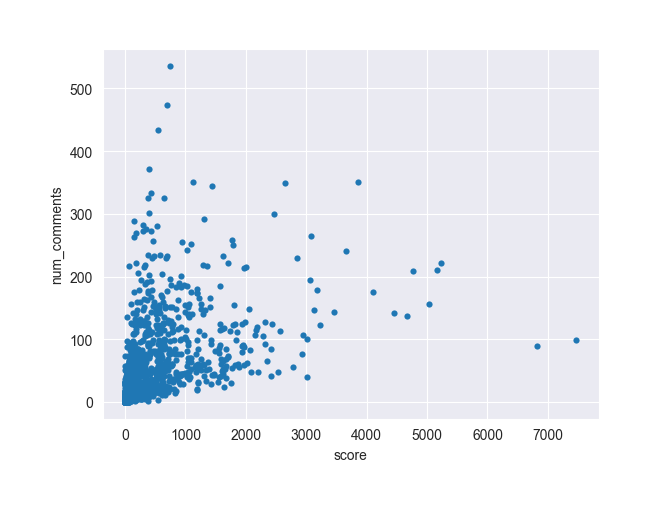

In [12]:
#Some quick visualizations
all_posts.plot('score', 'num_comments', kind='scatter')

In [13]:
#Let's make a plotly version of this
fig = px.scatter(all_posts, x='score', y='num_comments', color='subreddit')

fig.update_layout(
    title='Post Score versus Comments Colored by Subreddit',
    xaxis_title='Post Score',
    yaxis_title='Number of Comments'
)

fig.show()

In [14]:
#We have a TON of authors, we want people who have posted more than once for our network graph

#Let's look at authors who have posted more than once
repeating = all_posts[all_posts.duplicated(['author'], keep=False)]

#Get rid of deleted users 
repeating = repeating[repeating['author'] != "None"]

#Get number of authors
repeating.author.nunique()

72

[Text(0.5, 0, 'Authors'), Text(0, 0.5, 'Number of posts')]

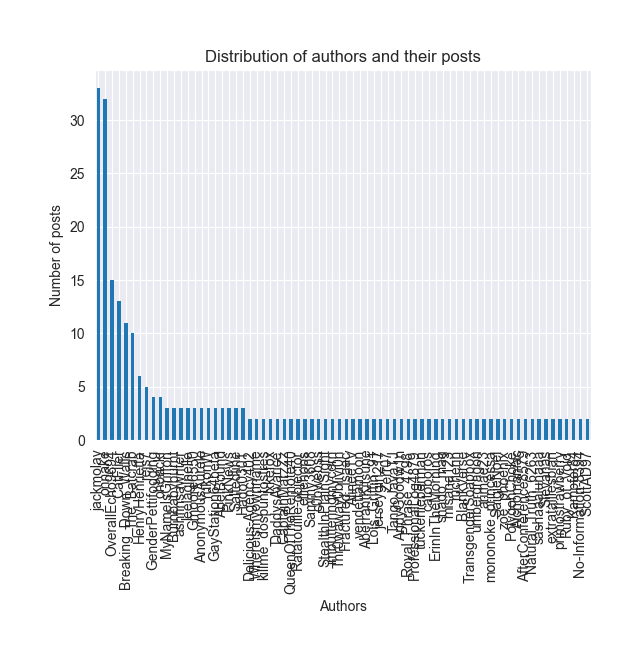

In [15]:
# See the distribution of authors and their posts
ax = repeating.author.value_counts().plot(kind='bar',title='Distribution of authors and their posts') 
ax.set(xlabel="Authors", ylabel="Number of posts")

In [16]:
#Compiling a list of authors that appeared more than once
u_authors = list(set(repeating.author.astype('str')))
authors_df =  pd.DataFrame() # Makes an empty dataframe
authors_df = authors_df.fillna(0)

#for u in u_authors: # Loops through every "influencer" user and gets 10 (or unlimited) top posts per user
#    c = get_user_posts(u, 10)
#    authors_df = pd.concat([authors_df, c])

for user in u_authors:
    try:
        user_posts_df = get_user_posts(user, 10)
        authors_df = pd.concat([authors_df, user_posts_df])
        time.sleep(2)  # Add a delay of 2 seconds between requests
    except Exception as e:
        print(f"An error occurred for user {user}: {e}")
#We get error alerts for accounts that have been suspended 


An error occurred for user ProfessionalLog4879: received 403 HTTP response
An error occurred for user AndyGoodw1n: received 403 HTTP response


In [17]:
#Let's look at the dataframe
authors_df.head(25)

,id,title,author,created_UTC,score,subreddit,num_comments
0,gxi3hh,Done with top surgery!,CaptainMarzZz,1.591409e+09,2017,ftm,62
1,hnb3km,1 month post top surgery!!,CaptainMarzZz,1.594185e+09,1640,ftm,24
2,w2zhid,Engaging Patrons with Audio Guides,CaptainMarzZz,1.658255e+09,15,MuseumPros,8
3,gcjcac,Quarantine Stoner struggling with top surgery ...,CaptainMarzZz,1.588475e+09,7,ftm,11
0,14a5y8f,'Pretty staggering': Thousands of California p...,BlankVerse,1.686844e+09,22569,California,1148
1,nhd3mu,Face masks effectively limit the probability o...,BlankVerse,1.621549e+09,43188,science,2163
2,h91bhx,President Barack Obama jokingly mimics U.S. Ol...,BlankVerse,1.592167e+09,112785,pics,4105
3,eyzbsk,Please do not send me any private messages (PM...,BlankVerse,1.580859e+09,4,u_BlankVerse,0
4,jjf87e,White House lists ending Covid-19 pandemic as ...,BlankVerse,1.603851e+09,107870,nottheonion,4223
5,ntrz08,"Walmart, McDonald's, and Amazon are among comp...",BlankVerse,1.623004e+09,79863,politics,2130


[Text(0.5, 0, 'Subreddits'), Text(0, 0.5, 'Number of posts')]

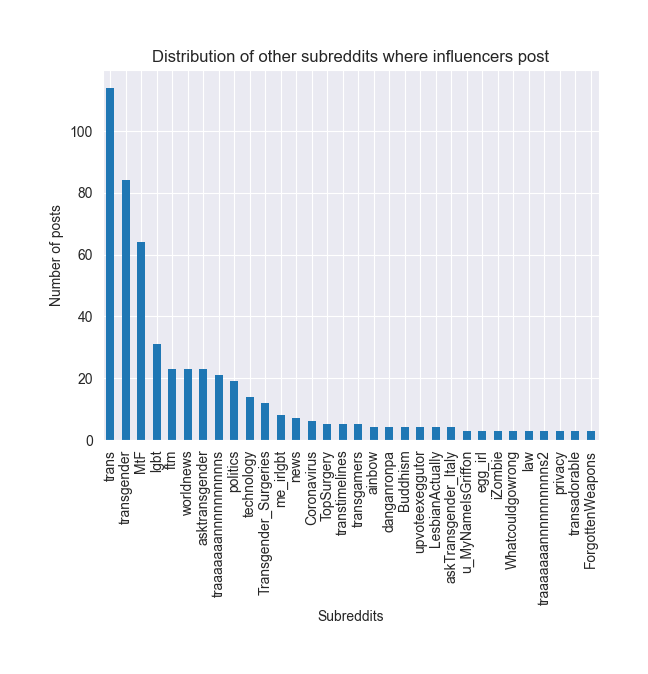

In [18]:
counts = authors_df['subreddit'].value_counts() 
# Only plot the subreddits that appear more than twice
ax = authors_df[authors_df['subreddit'].isin(counts[counts > 2].index)].subreddit.value_counts().plot(kind='bar',title='Distribution of other subreddits where influencers post') 
ax.set(xlabel="Subreddits", ylabel="Number of posts")

In [19]:
#Let's do it in plotly
#There are a lot of subreddits out there, let's get those that have appeared at least two times
#Convert Subreddit objects to their display name strings
authors_df['subreddit'] = authors_df['subreddit'].apply(lambda x: x.display_name if hasattr(x, 'display_name') else str(x))

#Get value counts for each subreddit and filter for those that have appeared at least 2 times 
counts = authors_df['subreddit'].value_counts()
filtered_df = authors_df[authors_df['subreddit'].isin(counts[counts > 2].index)]

# Compute value counts for filtered subreddits
subreddit_counts = filtered_df['subreddit'].value_counts().reset_index()
subreddit_counts.columns = ['subreddit', 'count']

# Create a bar plot with Plotly Express
fig = px.bar(
    subreddit_counts,
    x='subreddit',
    y='count',
    title='Distribution of Other Subreddits Where Authors Post',
    labels={'subreddit': 'Subreddits', 'count': 'Number of posts'}
)

# Show the plot
fig.show()

In [20]:
#Let's do a quick network analysis on the data we have so far
#Create a dataframe for the network graph consisting of authors and subreddits
#This will include our top authors
n_df = authors_df[['author', 'subreddit']]
n_df.head()

,author,subreddit
0,CaptainMarzZz,ftm
1,CaptainMarzZz,ftm
2,CaptainMarzZz,MuseumPros
3,CaptainMarzZz,ftm
0,BlankVerse,California


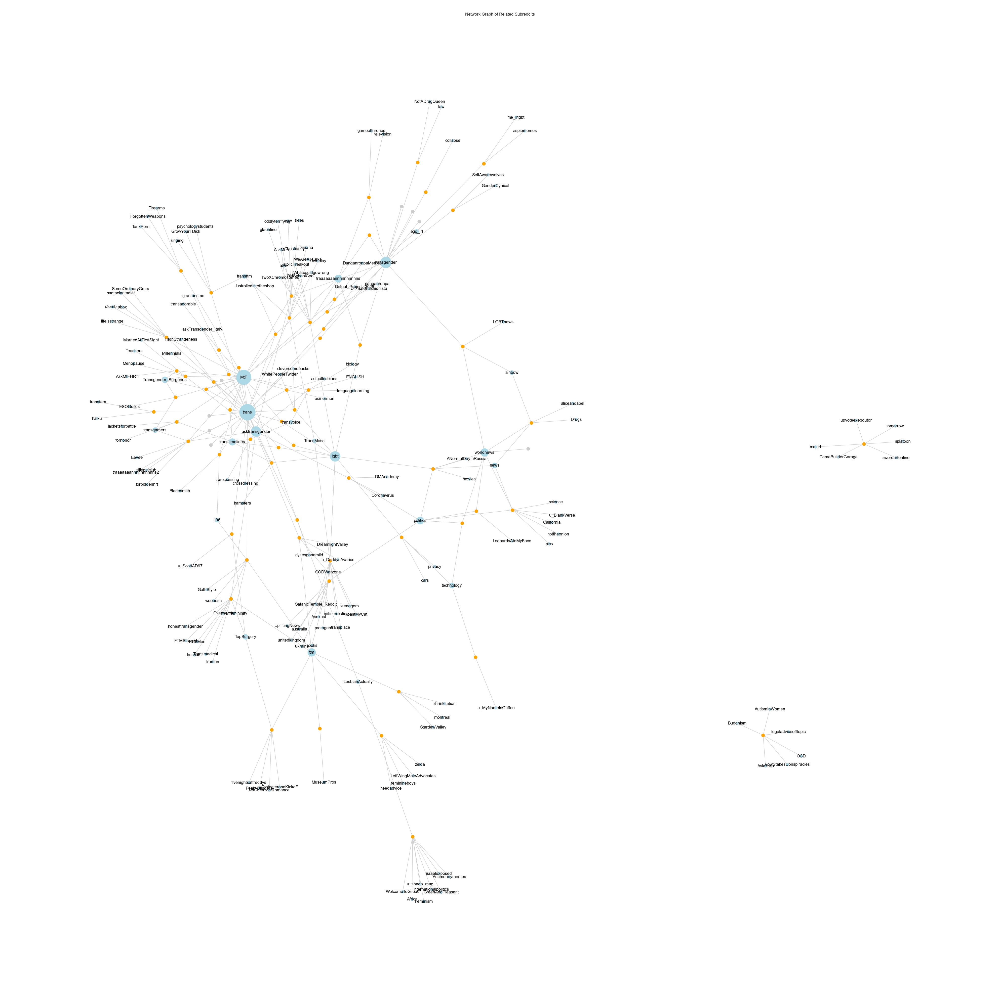

In [21]:
plt.figure(figsize=(50, 50))

#Create the graph from the DataFrame
g = nx.from_pandas_edgelist(n_df, source='author', target='subreddit')

#Create layout for nodes
layout = nx.spring_layout(g, iterations=50, scale=2)

#Unique subreddits
subs = list(n_df.subreddit.unique())
#Unique authors 
u_authors = list(n_df.author.unique())  

# Calculate node sizes based on degree (number of connections to that subreddit)
sub_size = [g.degree(sub) * 80 for sub in subs]
author_size = 100  #Size for author nodes
popular_author_color = 'orange'  #Color for highly connected authors
default_author_color = '#cccccc'  #Color for other authors

# Draw subreddit nodes
nx.draw_networkx_nodes(g, 
                       layout, 
                       nodelist=subs, 
                       node_size=sub_size,  # Size based on degree
                       node_color='lightblue') #Subreddits are blue 

#Draw author nodes
nx.draw_networkx_nodes(g, 
                       layout, 
                       nodelist=u_authors, 
                       node_color=default_author_color, #Gray ish 
                       node_size=author_size)

# Draw highly connected influencers
popular_people = [person for person in u_authors if g.degree(person) > 1]
nx.draw_networkx_nodes(g, 
                       layout, 
                       nodelist=popular_people, 
                       node_color=popular_author_color, #Orange 
                       node_size=author_size)

# Draw edges
nx.draw_networkx_edges(g, 
                       layout, 
                       width=1, 
                       edge_color="#cccccc") #Gray for the edges 

# Draw labels for subreddits only
node_labels = {sub: sub for sub in subs}
nx.draw_networkx_labels(g, 
                        layout, 
                        labels=node_labels)

# No axis needed
plt.axis('off')
plt.title("Network Graph of Related Subreddits")
plt.show()

### Examining Reddit Comments - Network Analysis 
Here we'll look at comments on posts to get a more granular look at the data. 

In [22]:
#Let's extract the comments on the post, and use that data for analysis - only need to run once 
#comments = []
#ids = all_posts['id']
#for id in ids:
  # print(list(ids).index(id))
#  submission = reddit.submission(id=id)
#  submission.comments.replace_more(limit=None)
#  for comment in submission.comments.list():
#    comments.append([comment.author, comment.body, comment.submission.title, comment.replies, comment.score, comment.id, comment.parent_id])

#comments_df = pd.DataFrame(comments, columns=['author', 'body', 'sub_title', 'replies', 'score', "ID", "parent_ID"])

In [23]:
#Saving the comments dataframe to csv, and re-reading it
#comments_df.to_csv("allcomments_090124.csv", index=False)
comments_df = pd.read_csv("allcomments_090124.csv")

In [24]:
#Let's look at the dataframe
comments_df.head()

,author,body,sub_title,replies,score,ID,parent_ID
0,SophieCalle,"They're best taken like an abusive partner, ne...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,211,kylxnae,t3_1byw23r
1,Mezahmay,Vatican threatens trans dignity and urges conf...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,96,kylxq8c,t3_1byw23r
2,JulieRose1961,The Catholic Church lost what little moral aut...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,146,kylxrps,t3_1byw23r
3,coralfire,"""Fuck them intersex kids."" - Pope Francis",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,130,kylvmrw,t3_1byw23r
4,One-Organization970,"Ah yes, the global cabal of pedophiles in ren ...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,86,kyly7zr,t3_1byw23r


In [25]:
#Creating adjacency matrix

#Select columns author and parent_ID
adjacency_df = comments_df[['author', 'parent_ID']].copy()

#Separate the parent_ID column into prefix and parent_ID
adjacency_df[['prefix', 'parent_ID']] = adjacency_df['parent_ID'].str.split('_', expand=True)

#Filter rows where prefix is NOT t3 - let's just get parent comments for now 
#The ID of the parent comment (prefixed with t1_). If it is a top-level comment, this returns the submission ID instead (prefixed with t3_).
#If a comment's parent_id begins with "t1" then it's a parent comment on a submission. Otherwise it's a response to another comment (when it begins with "t3".)
adjacency_df = adjacency_df[adjacency_df['prefix'] != 't3']

#Create a new column 'parent' using custom function get_author
adjacency_df['parent'] = get_author(adjacency_df['parent_ID'].tolist(), comments_df)

#Convert to str
adjacency_df['author'] = adjacency_df['author'].astype(str)
adjacency_df['parent'] = adjacency_df['parent'].astype(str)

#Group by author and parent to summarize counts
df_grouped = adjacency_df.groupby(['author', 'parent']).size().reset_index(name='count')

#Pivot wider to create a matrix with 'author' as rows and 'parent' as columns
#Remove rows with NA in author
adjacency = df_grouped.pivot_table(index='author', columns='parent', values='count', fill_value=0)

#Convert to matrix 
adjacency_matrix = adjacency.values

print(adjacency_matrix)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [26]:
#Create a matrix of replies

#Get replies by filtering author and parent_ID
replies_df = comments_df[['author', 'parent_ID']].copy()

#Separate the parent_ID column into prefix and parent_ID
replies_df[['prefix', 'parent_ID']] = replies_df['parent_ID'].str.split('_', expand=True)

#Filter rows where prefix is NOT t3
replies_df = replies_df[replies_df['prefix'] != 't3']

#Count replies
replies_count = len(replies_df)

print(replies_count) #29937 replies to comments
#There are a lot of interactions, but we only want to investigate the top interactors.

29937


In [27]:
#Let's look at our adjacency matrix
#How many authors?
print(adjacency_matrix.shape) # 9778 rows (authors), 9763 columns (parents) 

#We cannot plot all of these 

(9778, 9763)


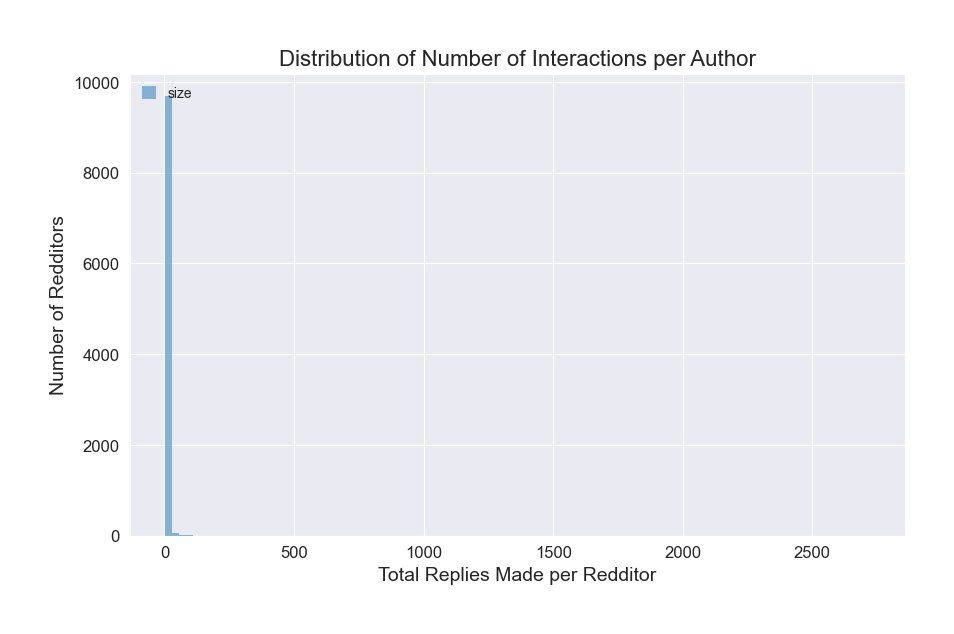

In [28]:
#Calculate the row sums to get the total number of interactions per author
author_inter = adjacency_df.groupby('author').size().to_frame('size').reset_index()

#Plotting the histogram using matplotlib and seaborn
plt.figure(figsize=(10, 6))
sns.histplot(author_inter, bins=100, kde=False)
plt.xlabel('Total Replies Made per Redditor', fontsize=14)
plt.ylabel('Number of Redditors', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Distribution of Number of Interactions per Author', fontsize=16)
plt.grid(visible=True)
plt.show()

#Most people only made less than a handful of comments.
#Setting the threshold to be greater than 20 comments will collapse most people.
#Redditors not meeting this threshold are "Others".

In [29]:
#Let's get the maximum number of replies
#nan has 2713 count. this could be from users that deleted their replies or account.
#we'll drop this value 
max_idx = author_inter['size'].idxmax()
nan = max_idx

# Drop the row if the author exists in the index
if nan in author_inter.index:
    author_inter.drop(nan, axis=0, inplace=True)

#We'll cut off the x axis to make the graph more readable

In [30]:
#Let's make it in plotly because it's prettier and more interactive 
fig = px.histogram(author_inter, x="size")

fig.update_layout(
    title='Number of Replies per Redditor',
    xaxis_title='Total Replies per Redditor',
    yaxis_title='Count',
    xaxis=dict(
        range=[0, 400]
    )
)
fig.show()

In [31]:
#Getting authors who had over 20 replies aka posts that had good interaction
threshold_authors = author_inter[author_inter['size'] > 20]['author'].tolist()

In [32]:
#Getting authors - authors with 20 replies or less are categorized as "other"
other_authors = author_inter[~author_inter['author'].isin(threshold_authors)]

In [33]:
#Final dataframe for network analysis: includes threshold of authors (those with more than 20 replies) and the "others" 

#Filter rows where 'author' is in 'threshold_authors'
filtered_adjacency_df = adjacency_df[adjacency_df['author'].isin(threshold_authors)]

#Get the "other" authors, drop nan strings, and rename them to "other"
others_df = adjacency_df[~adjacency_df['author'].isin(threshold_authors)]
others_df = others_df[~others_df.apply(lambda row: row.astype(str).str.contains('nan').any(), axis=1)]
others_df['author'] = 'other'

#Combine the DataFrames using pd.concat
final_adjacency_df = pd.concat([filtered_adjacency_df, others_df])

final_adjacency_df.head()

,author,parent_ID,prefix,parent
75,transcended_goblin,kylxnae,t1,SophieCalle
82,TransMontani,kylxrps,t1,JulieRose1961
83,Illiander,kylxrps,t1,JulieRose1961
88,transcended_goblin,kyly7zr,t1,One-Organization970
95,Illiander,kyn0e3f,t1,MemphisJook


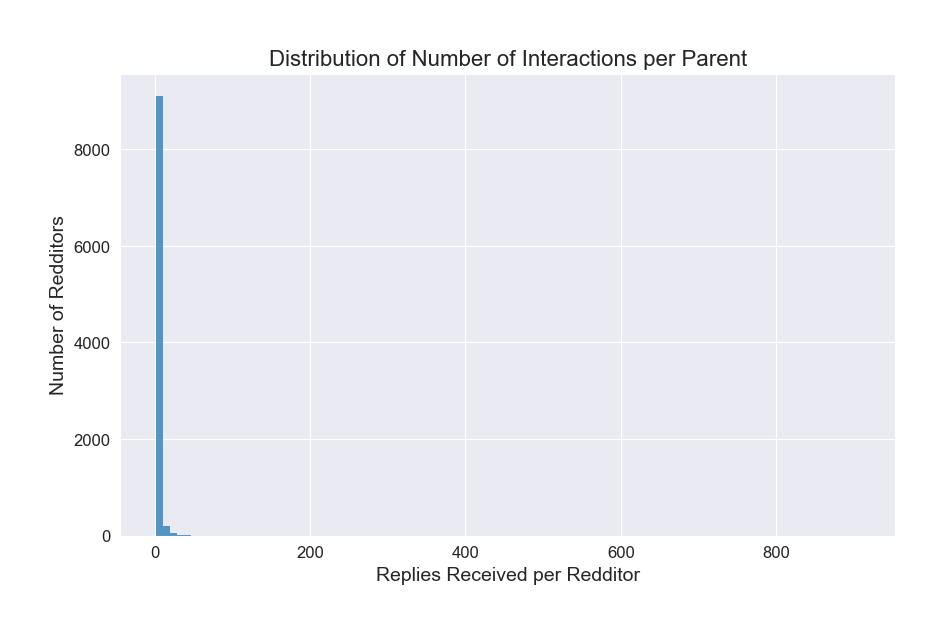

In [34]:
#Let's create a new graph where we plot interactions per parent 
parent_df = final_adjacency_df.groupby('parent').size().to_frame('size').reset_index()

#Plot histogram using seaborn/matplotlib
plt.figure(figsize=(10, 6))
sns.histplot(parent_df['size'], bins=100, kde=False)
plt.xlabel('Replies Received per Redditor', fontsize=14)
plt.ylabel('Number of Redditors', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Distribution of Number of Interactions per Parent', fontsize=16)
plt.grid(visible=True)
plt.show()

#Most people received very few replies. We chose to set the threshold to 20. Everyone else is "Others".

In [35]:
#Let's make it in plotly because it's prettier and more interactive 
fig = px.histogram(parent_df, x="size")

fig.update_layout(
    title='Number of Replies Received per Redditor',
    xaxis_title='Replies Received per Redditor',
    yaxis_title='Count',
    xaxis=dict(
        range=[0, 400]
    )
)
fig.show()

In [36]:
#Filter columns where the sum is at least 20 (parent received at least 20 replies) aka top parent comments 
threshold_parents = (parent_df[parent_df['size'] > 20]['parent']).to_list()

#Getting parents with 20 replies or less categorized as "other"
other_parents = parent_df[~parent_df['parent'].isin(threshold_parents)]
other_parents = other_parents[~other_parents.apply(lambda row: row.astype(str).str.contains('nan').any(), axis=1)]
other_parents['parent'] = 'other'

print(threshold_parents)
print(len(threshold_parents))

['Axuros', 'Bitter_Worker_2964', 'Charlotte_R6', 'Creativered4', 'Depressedduke', 'Destiny-Downfall', 'ElenTheMellon', 'EmoPrincxss666', 'Environmental-Ad9969', 'Eve_interupted', 'Fractured_Isaac', 'GFluidThrow123', 'HiddenStill', 'Impossible_PhD', 'Jolly-Room4626', 'Jtatertot92', 'LaFleurSauvageGaming', 'Linneroy', 'Logbound', 'Lokael', 'Lumihiutales', 'Medicalhuman', 'Moonlight_Katie', 'Neat-Bill-9229', 'NorCalFrances', 'Ollievonb02', 'One-Organization970', 'Own_Pomegranate9684', 'PerpetualUnsurety', 'Pseudonymico', 'RedFumingNitricAcid', 'Responsible-Way5056', 'RevengeOfSalmacis', 'RevolutionaryPen2976', 'Right-Zookeepergame7', 'RosabeIls', 'SSR_Adraeth', 'SirGentlemanOstrich', 'So-queer-I-am-hetero', 'SoVeryBohemian', 'StealthInPlainSight', 'Subpar_doodles', 'Sursiq', 'The-reall-KC', 'TheRealChupaLupa', 'The_Batcrab', 'TooMuchSalmonella', 'TransMontani', 'WHATSTHEYAAAMS', 'Which_Raccoon8696', 'YourDadThinksImCool_', 'ZelfraxKT', 'adrislnk', 'ashfinsawriter', 'bitchface-hatchling', 

In [37]:
#This is a network graph allowing us to see user interactions -- the MAJORITY of the plot is people from the "Other" category
#That's what we expect. People log on, make a comment, and then log off
# Convert adj_mat to a pandas DataFrame if it is not already one

# Create a Chord Diagram using pycirclize
# We have our original adjacency matrix, we need to filter for the threshold authors and the threshold parents 
# We can get rowsums and colsums to see who has had the most interaction, and that can make our matrix smaller
# Some additional preprocessing is needed here before we can make the diagram 
#circos = Circos.initialize_from_matrix(adjacency)
#fig = circos.plotfig()

## EDA - NLP preprocessing and visualizations

Here we will perform text preprocessing and visualization of the body of the texts. We will explore the post titles and the comments. 
The comments are more informative than the post titles as they indicate the nature of the discussion.  

In [38]:
#Let's take a look at the metadata 
all_posts.head()

,id,title,author,created_UTC,score,subreddit,num_comments
0,1byw23r,Vatican says ‘sex-change’ surgery risks threat...,OverallEcho9694,1.712578e+09,265,transgender,195
1,119s49r,NEW study: Regret After Gender Affirming Surge...,jackmolay,1.677139e+09,677,transgender,55
2,1dtzhe6,White House issues statement opposing gender-a...,onnake,1.719962e+09,140,transgender,92
3,1dzvhda,Japan High Court OKs gender change without sur...,HiddenJasmine,1.720617e+09,562,transgender,16
4,1drrozb,Biden Administration Opposes Surgery for Trans...,Scary_Towel268,1.719716e+09,125,transgender,52


In [39]:
#Let's take a look at the comments
comments_df.head()

,author,body,sub_title,replies,score,ID,parent_ID
0,SophieCalle,"They're best taken like an abusive partner, ne...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,211,kylxnae,t3_1byw23r
1,Mezahmay,Vatican threatens trans dignity and urges conf...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,96,kylxq8c,t3_1byw23r
2,JulieRose1961,The Catholic Church lost what little moral aut...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,146,kylxrps,t3_1byw23r
3,coralfire,"""Fuck them intersex kids."" - Pope Francis",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,130,kylvmrw,t3_1byw23r
4,One-Organization970,"Ah yes, the global cabal of pedophiles in ren ...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,86,kyly7zr,t3_1byw23r


In [40]:
#Let's count words in each comment
comments_df['word_count'] = comments_df.body.str.split().map(lambda x: len(x))

# Plot with plotly
fig = px.histogram(comments_df, 
                   x="word_count", 
                   title='Histogram of Word Counts in Comments',
                   labels={'word_count': 'Word Count'},
                   opacity=0.8,
                   marginal="box"
                   )
fig.show() #Most comments are short 

In [41]:
# Count the number of special characters in the text 
# First, remove the newline characters, because that will mess things up
comments_df['special_char_text_only'] = comments_df.body.apply(remove_newline_char)
comments_df['num_special_chars'] = comments_df.special_char_text_only.apply(count_special)

 # Create a histogram visualizing the distribution  
fig = px.histogram(comments_df, 
                   x="num_special_chars", 
                   title='Histogram of Special Character Count',
                   labels={'num_special_chars': 'Special Char'},
                   opacity=0.8,
                   marginal="box"
                   )
fig.show()

In [48]:
#Count total characters in posts
# Create new variable with string count
comments_df['text_char'] = comments_df.body.str.len()
 
# Plot with plotly
fig = px.histogram(comments_df, 
                   x="text_char", 
                   title='Histogram of Character Count',
                   labels={'text_char': 'Character Count'},
                   opacity=0.8,
                   marginal="box"
                   )
fig.show()

In [45]:
#Count stopwords
comments_df['num_stopwords'] = comments_df.body.apply(count_stopwords) 

fig = px.histogram(comments_df, 
                   x="num_stopwords", 
                   title='Histogram of Stopword Count',
                   labels={'num_stopwords': 'Stopwords'},
                   opacity=0.8,
                   marginal="box"
                   )
fig.show()

In [46]:
#Let's perform all of the preprocessing steps on the text - this does not form tokens
comments_df['clean_body'] = comments_df.body.apply(preprocess_text)

In [47]:
#Let's do the same thing but form a list of tokens for visualizations
comments_df['clean_tokens'] = comments_df.body.apply(create_tokens)

In [55]:
comments_df.head(25)


,author,body,sub_title,replies,score,ID,parent_ID,word_count,special_char_text_only,num_special_chars,num_stopwords,clean_body,clean_tokens,text_char
0,SophieCalle,"They're best taken like an abusive partner, ne...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,211,kylxnae,t3_1byw23r,28,"They're best taken like an abusive partner, ne...",9,58.064516,well take like abusive partner trust treat rig...,"[well, take, like, abusive, partner, trust, tr...",159
1,Mezahmay,Vatican threatens trans dignity and urges conf...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,96,kylxq8c,t3_1byw23r,7,Vatican threatens trans dignity and urges conf...,1,14.285714,vatican threaten trans dignity urge conformity,"[vatican, threaten, trans, dignity, urge, conf...",53
2,JulieRose1961,The Catholic Church lost what little moral aut...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,146,kylxrps,t3_1byw23r,19,The Catholic Church lost what little moral aut...,0,42.105263,catholic church lose little moral authority co...,"[catholic, church, lose, little, moral, author...",117
3,coralfire,"""Fuck them intersex kids."" - Pope Francis",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,130,kylvmrw,t3_1byw23r,7,"""Fuck them intersex kids."" - Pope Francis",4,16.666667,fuck intersex kid pope francis,"[fuck, intersex, kid, pope, francis]",41
4,One-Organization970,"Ah yes, the global cabal of pedophiles in ren ...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,86,kyly7zr,t3_1byw23r,31,"Ah yes, the global cabal of pedophiles in ren ...",3,35.483871,ah yes global cabal pedophile ren faire costum...,"[ah, yes, global, cabal, pedophile, ren, faire...",190
5,queen-of-support,Oops! Too late for me 😂😂😂,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,22,kylw39e,t3_1byw23r,6,Oops! Too late for me 😂😂😂,1,37.500000,oops late 😂 😂 😂,"[oops, late, 😂, 😂, 😂]",25
6,NaN,"Raised Catholic, I still fail to understand ho...",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,24,kym5f4b,t3_1byw23r,75,"Raised Catholic, I still fail to understand ho...",20,53.947368,raise catholic fail understand likeness image ...,"[raise, catholic, fail, understand, likeness, ...",425
7,ChickinSammich,Does mutilating a penis threaten an infant's d...,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,21,kymbvnw,t3_1byw23r,55,Does mutilating a penis threaten an infant's d...,10,52.830189,mutilate penis threaten infant dignitydoe mole...,"[mutilate, penis, threaten, infant, dignitydoe...",333
8,DunkChunkerton,The Catholic Church? Hypocritical?\n\nNo way....,Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,39,kylxkgl,t3_1byw23r,22,The Catholic Church? Hypocritical?No way.I do...,4,47.619048,catholic church hypocriticalno wayi understand...,"[catholic, church, hypocriticalno, wayi, under...",137
9,Quietuus,"Fuck you Frank, I'm getting EXTRA bottom surgery.",Vatican says ‘sex-change’ surgery risks threat...,<praw.models.comment_forest.CommentForest obje...,13,kymilyz,t3_1byw23r,8,"Fuck you Frank, I'm getting EXTRA bottom surgery.",3,44.444444,fuck frank m get extra surgery,"[fuck, frank, m, get, extra, surgery]",49


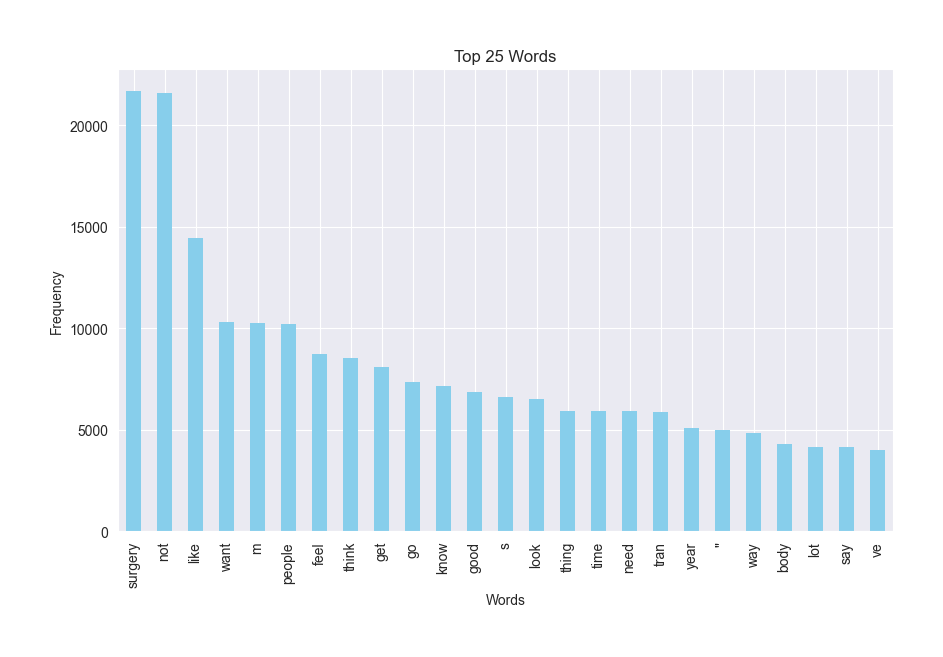

In [49]:
#Word frequency distribution
word_freq = pd.Series(np.concatenate(comments_df['clean_tokens'])).value_counts()

# Plot top N words
plt.figure(figsize=(10, 6))
word_freq.head(25).plot(kind='bar', color='skyblue')
plt.title('Top 25 Words')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()

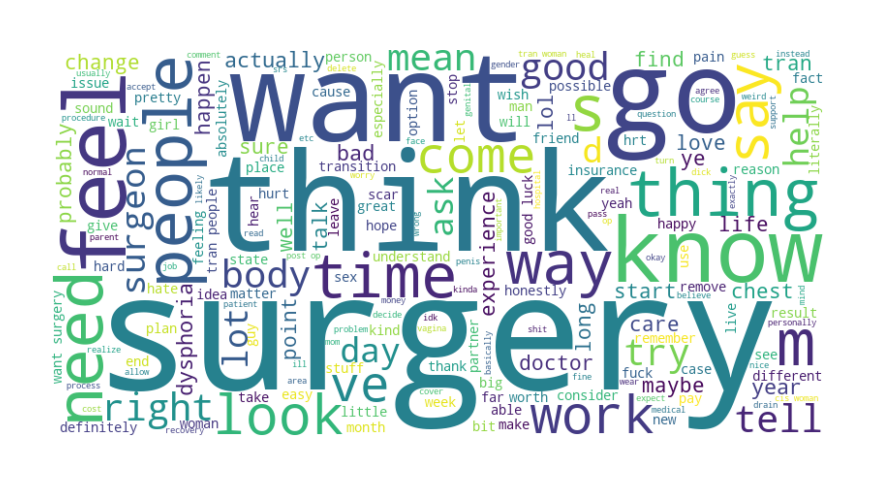

In [50]:
 #Word cloud visualization
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(np.concatenate(comments_df['clean_tokens'])))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [51]:
#Vocabulary size
vocabulary_size = len(set(np.concatenate(comments_df['clean_tokens'])))
print(f'Vocabulary Size: {vocabulary_size}')

Vocabulary Size: 49083


In [53]:
#Let's save because it took a while to run
comments_df.to_csv('comments_analysis.csv', index=False)